# Vectors of change

In [1]:
from koselleck import *

In [39]:
dfkw=get_keywords()
keywords=set([w.lower() for w in dfkw.word if w and w!='?'])
len(keywords)

207

In [3]:
diffs=get_dfchange_simple().fillna(0)
diffs['is_keyword']=[w in keywords for w in diffs.index]
diffs.is_keyword.value_counts()

False    5171
True      107
Name: is_keyword, dtype: int64

## PCA

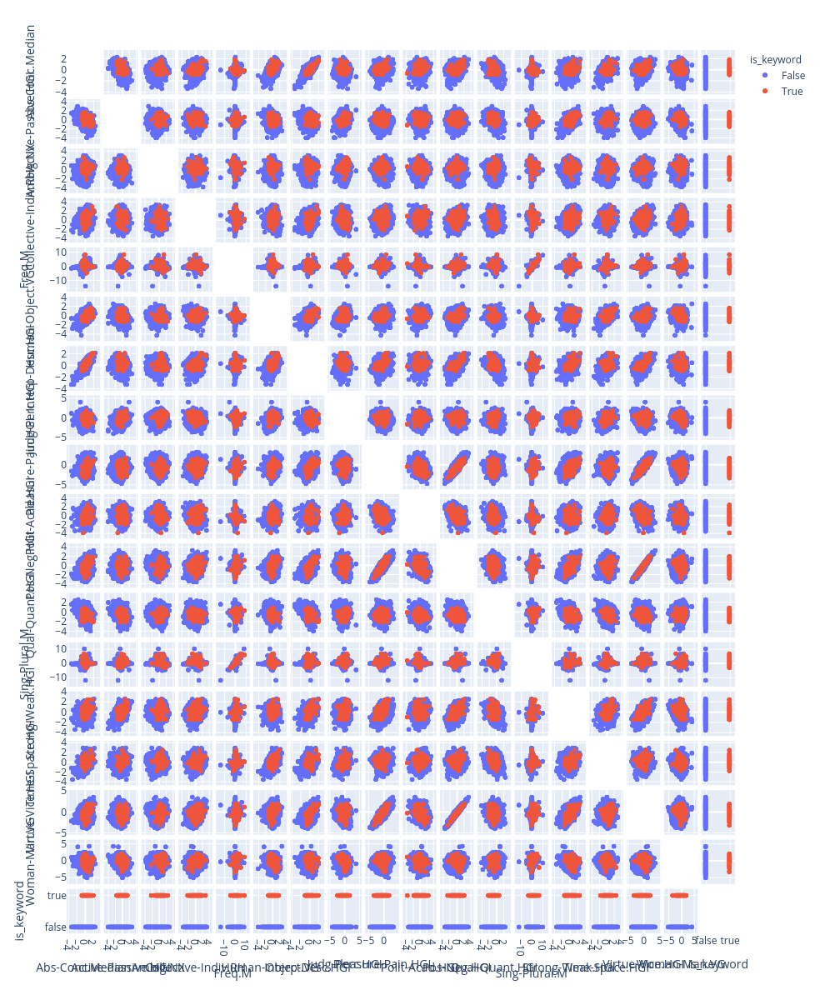

In [4]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.preprocessing import StandardScaler

df = diffs
features = df.columns
X = diffs
fig = px.scatter_matrix(
    df,
    dimensions=features,
    color="is_keyword",
    width=1200,
    height=1200,
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [5]:
def plot_pca(df,sample_n=100):
    from plotly.graph_objs.layout.annotation import Font
    
#     df=df.groupby('is_keyword').sample(n=sample_n,replace=True).drop_duplicates() if sample_n else df
    df=pd.concat(gdf if gi==True else gdf.sample(n=sample_n)
                 for gi,gdf in df.groupby('is_keyword'))
    features = df.columns
    X = df
    pca = PCA(n_components=2)
    components = pca.fit_transform(X)

    loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

    fig = px.scatter(components, x=0, y=1, color=df['is_keyword'], text=df.index, width=1200, height=1200)

    for i, feature in enumerate(features):
        fig.add_shape(
            type='line',
            x0=0, y0=0,
            x1=loadings[i, 0] * 4,
            y1=loadings[i, 1] * 4,
            fillcolor='red',
        )
        fig.add_annotation(
            x=loadings[i, 0]*4,
            y=loadings[i, 1]*4,
            ax=0, ay=0,
            xanchor="center",
            yanchor="bottom",
            text=feature,
            showarrow=True,
            font=Font(color='red')
        )
    fig.show()

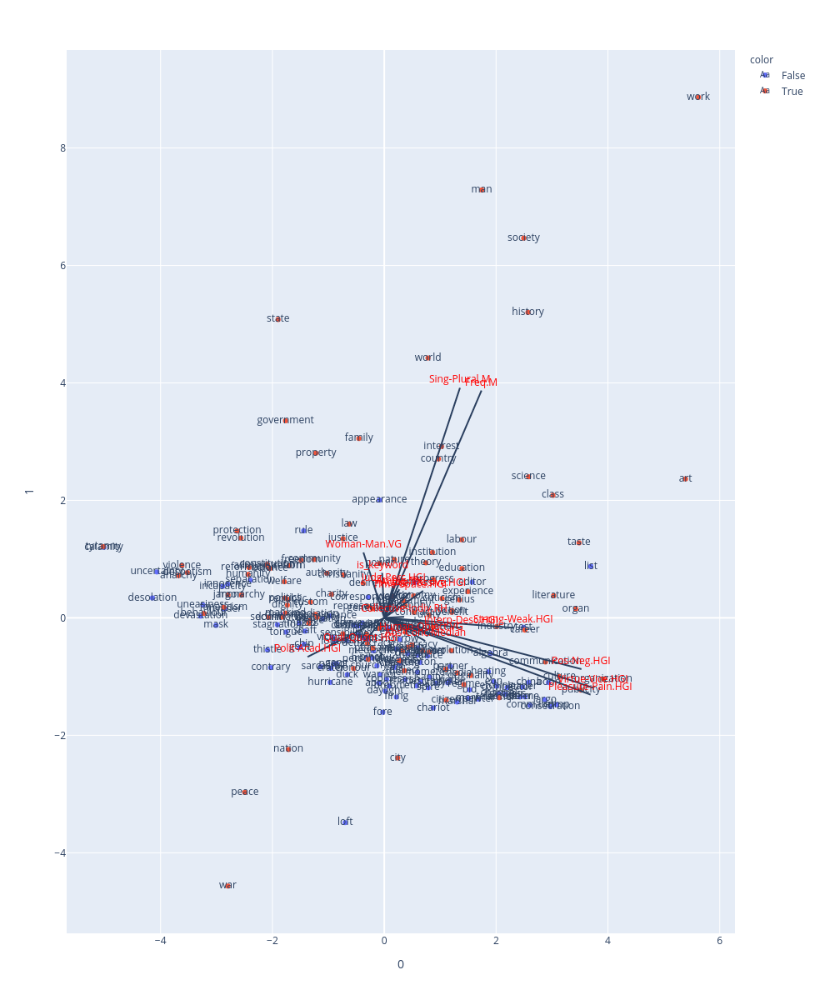

In [6]:
plot_pca(diffs)

In [7]:
# pca = PCA()
# components = pca.fit_transform(df[features])
# loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
    
# labels = {
#     str(i): f"PC {i+1} ({var:.1f}%)"
#     for i, var in enumerate(pca.explained_variance_ratio_ * 100)
# }
# fig = px.scatter_matrix(
#     components,
#     labels=labels,
#     dimensions=range(4),
#     color=df["is_keyword"],
#     width=1200,
#     height=1200
# )
# for i, feature in enumerate(features):
#     fig.add_shape(
#         type='line',
#         x0=0, y0=0,
#         x1=loadings[i, 0] * 4,
#         y1=loadings[i, 1] * 4,
#         fillcolor='red',
#     )
#     fig.add_annotation(
#         x=loadings[i, 0]*4,
#         y=loadings[i, 1]*4,
#         ax=0, ay=0,
#         xanchor="center",
#         yanchor="bottom",
#         text=feature,
#         showarrow=True,
#         font=Font(color='red')
#     )
# fig.update_traces(diagonal_visible=False)
# fig.show()

In [62]:

def plot_dendro(df):
    import plotly.figure_factory as ff
    X=df.values
    fig = ff.create_dendrogram(X, orientation='left', labels=df.index, color_threshold=5)
    fig.update_layout(width=800, height=1300)
    fig.show()

In [63]:
dfc=get_dfchange()
dfc12=get_dfchange_simple(dfc, 'mean1').append(get_dfchange_simple(dfc, 'mean2'))
words_ever_abs=set(dfc12[dfc12['Abs-Conc.Median']>1].index)
len(words_ever_abs)

1722

In [64]:
for w in ['growth','improvement']:
    diffs.loc[w]['is_keyword']=True


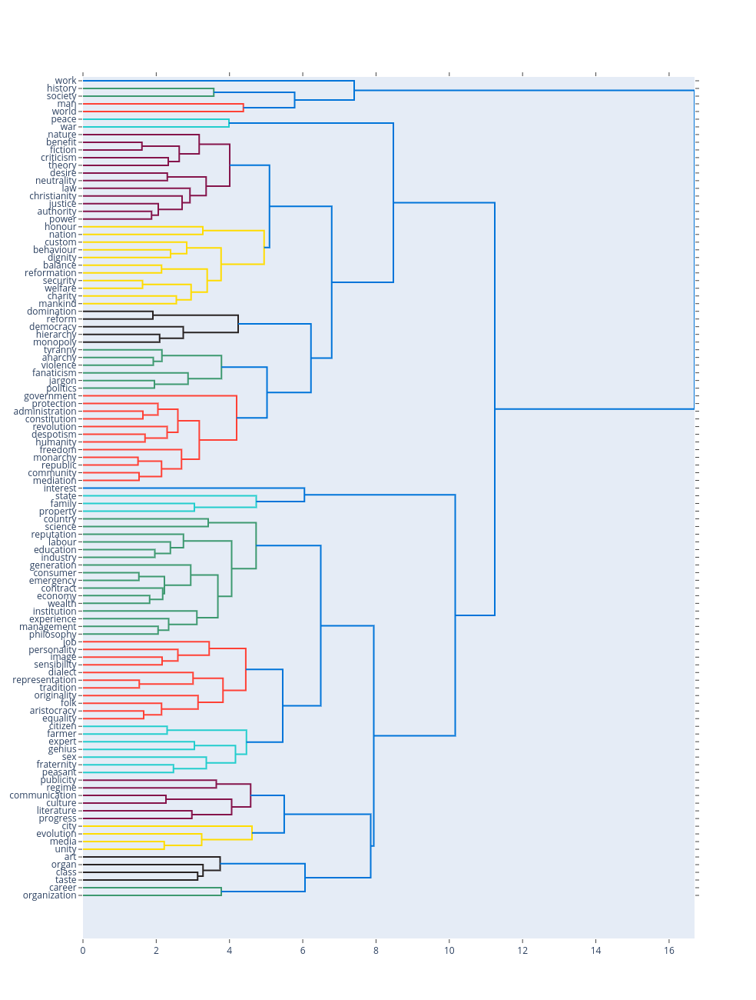

In [65]:
#figdf=diffs.loc[words_ever_abs & set(diffs.index)].groupby('is_keyword').sample(n=100,replace=True).drop_duplicates()
figdf=diffs[diffs.is_keyword==True]
plot_dendro(figdf)

## TSNE

In [12]:
from sklearn.manifold import TSNE
X = diffs.values
X_embedded = TSNE(n_components=2).fit_transform(X)

In [13]:
Xedf=pd.DataFrame(X_embedded, columns=['tsne1', 'tsne2'])
Xedf

,tsne1,tsne2
0,-28.431755,-27.036434
1,7.878071,25.019247
2,-4.101410,-24.522043
3,66.654541,-6.543991
4,-3.497834,16.551418
...,...,...
5273,23.273184,10.480541
5274,-42.209141,12.768105
5275,20.954519,40.389843
5276,71.189537,-8.203537


In [14]:
tdiffs=diffs.reset_index().join(Xedf).set_index('word')

In [15]:
figdf=tdiffs.loc[words_ever_abs & set(diffs.index)].groupby('is_keyword').sample(n=200,replace=True).drop_duplicates().reset_index()
figdf

,word,Abs-Conc.Median,Active-Passive.HGI,Ambig.NX,Collective-Indiv.RH,Freq.M,Human-Object.VG,Interp-Desc.HGI,Judg-Perc.HGI,Pleasure-Pain.HGI,...,Pos-Neg.HGI,Qual-Quant.HGI,Sing-Plural.M,Strong-Weak.HGI,Time-Space.HGI,Virtue-Vice.HGI,Woman-Man.VG,is_keyword,tsne1,tsne2
0,posterity,-0.819578,0.942097,1.111548,-0.537181,-0.127202,-0.690463,-0.792564,0.784288,-1.899939,...,-1.193174,-0.414375,0.000000,-0.348801,0.346086,-1.318335,-1.033021,False,-22.202854,-38.880909
1,juncture,-0.531582,0.229278,-0.538767,-0.974461,-0.043600,0.238901,-0.447182,-0.370922,-1.100914,...,-1.251586,0.174243,0.000000,-0.284900,-0.157640,-1.170309,0.395431,False,-21.112085,-33.337376
2,reconciliation,0.647770,-0.304787,0.396933,0.148905,0.005218,0.147116,0.241666,-0.643252,-0.980671,...,-0.470182,-0.362012,0.000000,-0.366641,0.854655,-0.619140,0.908037,False,-33.116066,-31.638395
3,gallantry,0.451438,0.655937,-1.895792,-2.066625,-0.016064,0.263571,0.243062,1.295015,0.282556,...,-0.098491,0.610747,0.001494,1.444624,0.933174,-0.060111,-2.139659,False,-11.457469,44.920712
4,acquiescence,0.666957,-0.289906,-0.099167,-0.211084,0.013727,0.452899,-0.082316,-0.815733,-0.334677,...,0.080832,-0.314169,0.000000,0.276781,0.086569,-0.044182,0.473179,False,8.228858,-2.390840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260,domination,0.644844,0.687268,-0.313480,1.696790,0.022784,-0.364641,0.553069,-0.156282,-1.933254,...,-1.233462,-1.266337,0.000000,1.303329,0.347892,-1.202209,-0.790748,True,-59.015614,-5.284380
261,politics,-0.160874,0.303954,0.035131,-0.431342,0.383041,-0.506499,-0.459042,0.353454,-0.752171,...,-1.181713,-0.138926,0.000000,0.249717,0.457450,-1.385013,-0.244600,True,-22.858974,3.230372
262,tradition,-0.159208,0.114329,-0.144663,-0.931903,0.351498,-0.170565,0.005789,-0.423035,-0.026217,...,-0.162443,-0.163236,0.137103,0.701155,0.101137,-0.047290,0.422159,True,-7.341315,-5.414465
263,tyranny,0.021746,-0.011054,0.336899,0.230354,0.005292,-0.321831,-0.480300,0.574141,-3.104937,...,-2.677592,-0.622046,-0.048741,-1.270559,0.622616,-3.098991,-0.036105,True,-65.267448,-35.257862


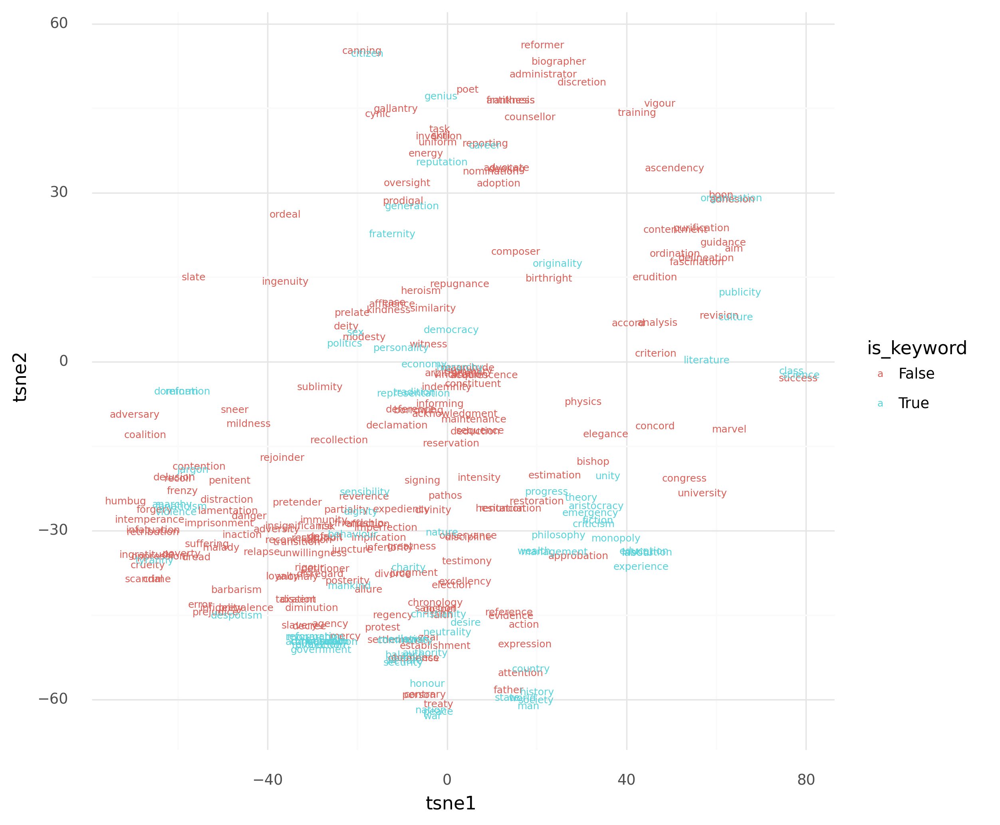

<ggplot: (8730949539369)>

In [16]:
p9.options.figure_size=8,8
fig=p9.ggplot(p9.aes(x='tsne1', y='tsne2', label='word', color='is_keyword'), data=figdf)
fig+=p9.geom_text(size=6)
fig+=p9.theme_minimal()
fig

## Bipartite network

In [17]:
ccdf=pd.read_csv('data/data.word_changes_classed.csv')
ccdf=ccdf[~ccdf.vector.isna()]
ccdf

,Unnamed: 0,vector,word,mean1,mean2,mean_diff,mean_diff_t,mean_diff_p,mean_diff_t_abs,len1,...,score_diff_abstractness,is_clean_noiseaware,neighborhood1_local,neighborhood2_local,score_diff_t_abstractness,score_diff_p_abstractness,class_abs,class_change,class_signif,class
0,0,Sing-Plural.M,guile,-0.347493,-0.422681,-0.075187,inf,0.000000e+00,inf,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Sing-Plural.M,patronage,1.165569,2.996845,1.831276,-3.669833e+16,0.000000e+00,3.669833e+16,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Sing-Plural.M,haft,1.611224,-0.701572,-2.312796,9.222264e+02,0.000000e+00,9.222264e+02,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Sing-Plural.M,intellect,-1.374228,0.822721,2.196948,-6.828419e+02,0.000000e+00,6.828419e+02,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Sing-Plural.M,fob,0.306604,1.452882,1.146278,-5.629519e+02,6.632584e-319,5.629519e+02,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80415,87760,Interp-Desc.HGI,cowardice,1.439497,1.432084,-0.007414,1.134834e-01,6.599224e-01,4.963063e-01,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80416,87761,Judg-Perc.HGI,mic,0.269200,0.282930,0.013730,-1.702010e-01,6.794600e-01,4.723145e-01,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80417,87762,Active-Passive.HGI,curve,0.337852,0.350669,0.012817,-2.096048e-01,6.975926e-01,4.352710e-01,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
80418,87763,Abs-Conc.Median,ferry,-1.403208,-1.401636,0.001572,-3.241239e-02,7.020536e-01,4.234442e-01,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
def classify_vector_change(row,perc_threshold=75):
    name=row.vector
    ns=str(name).split('.')[0].split('-')
    n1,n2=ns[0],ns[-1]
    res=''
    if row.mean_diff_p<0.05 and (abs(row.mean_diff) > .5 and row.perc>50):
        res=f'+{n1}' if row.mean_diff>0 else (f'+{n2}' if n2!=n1 else f'-{n1}')
        new=(row.mean2>.5 and row.mean1<0.5) if row.mean_diff>0 else (row.mean2<-.5 and row.mean1>-0.5)
        if new: res='+'+res
#         else: res=''
    return res

In [19]:
ccdf['class_vec_change']=ccdf.apply(classify_vector_change,1)

In [20]:
ccdf[ccdf.word=='history'][['word','vector','mean1','mean2','perc','mean_diff','class_vec_change']].sort_values('mean_diff')

,word,vector,mean1,mean2,perc,mean_diff,class_vec_change
39657,history,Judg-Perc.HGI,-0.131587,-0.896191,49.544807,-0.764605,
43676,history,Collective-Indiv.RH,2.745999,2.317706,44.655614,-0.428293,
5963,history,Sing-Plural.M,1.099634,0.757826,91.586623,-0.341808,
44054,history,Human-Object.VG,0.930780,0.680724,44.197573,-0.250055,
59673,history,Polit-Acad.HGI,-1.853288,-1.996167,25.171766,-0.142879,
73374,history,Time-Space.HGI,1.278903,1.189901,8.533014,-0.089003,
63778,history,Active-Passive.HGI,-0.089497,0.013078,20.181166,0.102575,
64067,history,Qual-Quant.HGI,-1.666722,-1.488082,19.826810,0.178639,
48777,history,Abs-Conc.Median,1.226236,1.407172,38.439013,0.180936,
55073,history,Pos-Neg.HGI,1.583977,1.806674,30.750299,0.222698,


In [21]:
g=nx.Graph()
for i,row in ccdf.iterrows():
    w=row.word
    if w not in words_ever_abs: continue
    c=row.class_vec_change
    c=c[:-1] if c.endswith('+') else c
    if w and c and not '~' in c and 'Freq' not in c and 'Changed' not in c and 'Indiv' not in c:
        if not g.has_node(w): g.add_node(w,node_type='Word')
        if not g.has_node(c): g.add_node(c,node_type='Change')
        g.add_edge(w,c)
        
g.order(),g.size()

(1628, 10473)

In [22]:
pd.Series(dict(g.degree())).sort_values()

mythology        1
phraseology      1
ally             1
calling          1
superiority      1
              ... 
++Vice         357
+Woman         379
+Abs           407
++Pain         439
+Pain          444
Length: 1628, dtype: int64

In [23]:
nx.write_gexf(g, 'data/data.graph.word2class.v2.gexf')

In [24]:
list(g.neighbors('history'))

['++Ambig', '+Woman', '+Interp', '+Strong']

In [25]:
', '.join(ccdf[(ccdf.word.isin(words_ever_abs)) & (ccdf.class_vec_change=='-Ambig')].sort_values('mean_diff').word)

'fame, congratulation, exaggeration, forgery, pretension, musician, language, judaism, drunkard, regeneration, dissent, faithfulness, believer, delegate, blunder, falsehood, conflict, bitterness, rashness, penance, thesis, instinct, ostentation, rectitude, struggle, constancy, inaccuracy, distraction, supporter, meanness, rudeness, antiquarian, papacy, accord, epoch, risk, righteousness, mockery, blasphemy, society, insensibility, paganism, formality, admonition, intercourse, absolution, incredulity, statesman, suffering, resolution, cognizance, instruction, affectation, peril, acuteness, intellect, serenity, baseness, election, project, probability, digression, acquaintance, period, understanding, gentleness'

## Classification

In [26]:
from lltk.model.classifier import Classifier

In [27]:
cdf=diffs.reset_index()[diffs.reset_index().word.isin(words_ever_abs|keywords)].set_index('word')
cdf

,Abs-Conc.Median,Active-Passive.HGI,Ambig.NX,Collective-Indiv.RH,Freq.M,Human-Object.VG,Interp-Desc.HGI,Judg-Perc.HGI,Pleasure-Pain.HGI,Polit-Acad.HGI,Pos-Neg.HGI,Qual-Quant.HGI,Sing-Plural.M,Strong-Weak.HGI,Time-Space.HGI,Virtue-Vice.HGI,Woman-Man.VG,is_keyword
word,,,,,,,,,,,,,,,,,,
abatement,0.903435,-0.978163,-0.026907,0.012252,-0.035067,0.493241,0.632570,-0.328927,-1.058109,0.232492,-0.455081,-0.563007,0.000000,-0.692968,0.858250,-0.563220,0.223919,False
abbe,0.972740,-0.819915,0.532241,-1.449761,-0.083159,1.361534,0.972366,0.473284,0.635181,1.006012,0.432959,-1.194389,0.000000,0.048162,0.761869,0.334886,0.296823,False
abdication,0.625302,-0.384502,0.067178,-0.031007,-0.023107,0.266385,0.396581,-0.418546,-0.801340,1.592737,-0.878820,-0.499031,0.000000,-0.416243,1.009800,-0.932413,0.488188,False
abhorrence,0.130148,-0.964385,-0.444039,-0.242990,-0.043462,-0.230412,-0.511266,0.486988,-2.605334,0.539744,-2.268983,-0.174659,0.000000,-1.178606,-0.023642,-2.887017,-0.005044,False
ability,-0.083779,1.591030,0.467944,-0.013581,0.515807,-0.003928,0.300761,0.778904,0.243419,-2.152134,1.160554,-0.921999,0.843522,1.855143,0.444014,1.347996,-1.009212,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wretchedness,0.852205,-1.665477,-0.416943,-0.284495,0.048767,0.236207,0.284167,0.119806,-3.144211,1.051222,-1.917801,-0.541718,0.000000,-1.889563,0.466210,-2.622491,0.062768,False
writer,0.407163,0.389418,0.145319,-0.187104,0.887961,0.039334,0.917013,0.993769,0.795222,-0.510193,0.565058,-0.374286,0.616428,1.472257,0.088637,0.479841,0.014635,False
writing,-0.257052,0.193122,1.518755,-0.503596,0.441402,-0.929237,-0.155963,0.910912,0.323386,-1.023574,-0.071167,0.232669,0.575807,-0.027098,0.209607,-0.209210,1.282510,False


In [28]:
cmodel = Classifier(cdf)

In [29]:
cmodel.classify('is_keyword', leave_one_out=True)

In [30]:
cmodel.report()

## Report for Model (Classifier)
              precision    recall  f1-score   support

       False       0.64      0.64      0.64       107
        True       0.64      0.64      0.64       107

    accuracy                           0.64       214
   macro avg       0.64      0.64      0.64       214
weighted avg       0.64      0.64      0.64       214



In [31]:
cmodel.dfc

,feat,coeff
0,Abs-Conc.Median,-0.097746
9,Polit-Acad.HGI,-0.036245
16,Woman-Man.VG,-0.035178
14,Time-Space.HGI,-0.022515
8,Pleasure-Pain.HGI,-0.009755
11,Qual-Quant.HGI,-0.008274
15,Virtue-Vice.HGI,0.006572
6,Interp-Desc.HGI,0.010292
7,Judg-Perc.HGI,0.014615
10,Pos-Neg.HGI,0.021784


In [46]:
odf=cmodel.df.groupby('is_keyword').mean().T
odf.columns=['NotKeyword','Keyword']
odf['diff']=odf['Keyword']-odf['NotKeyword']
odf=odf.join(cmodel.dfc.set_index('feat')).sort_values('diff',ascending=False)
odf=odf.rename_axis('feat').reset_index()
odf['feat']=odf['feat'].apply(lambda x: '+'+x.split('.')[0].split('-')[0])
coefdf=odf
coefdf

,feat,NotKeyword,Keyword,diff,coeff
0,+Collective,-0.231943,0.321659,0.553602,0.194830
1,+Sing,0.123302,0.561067,0.437765,0.100847
2,+Freq,0.140475,0.553241,0.412766,0.094085
3,+Ambig,0.042559,0.449559,0.407000,0.143328
4,+Active,-0.165989,0.220989,0.386978,0.101230
5,+Strong,0.061985,0.363820,0.301835,0.086232
6,+Pos,-0.396259,-0.145753,0.250506,0.021784
7,+Virtue,-0.513896,-0.273315,0.240581,0.006572
8,+Pleasure,-0.766882,-0.586162,0.180719,-0.009755
9,+Judg,0.019215,0.082839,0.063624,0.014615


## Diff of means

In [42]:
odmdf=pd.DataFrame()
for n in range(25):
    dmdf=cmodel.resample('is_keyword')
    o=[]
    for col in dmdf.columns:
        if col=='is_keyword': continue
        vals1=dmdf[dmdf.is_keyword==True][col]
        vals2=dmdf[dmdf.is_keyword==False][col]
        od={'feat':'+'+col.split('-')[0].split('.')[0],
            'NotKeyword':vals2.mean(), 'Keyword':vals1.mean(), 'diff':vals1.mean() - vals2.mean()}
        od['t'],od['p']=ttest_ind(vals1,vals2)
        od['t_abs']=abs(od['t'])
        o.append(od)
    odmdf1=pd.DataFrame(o).sort_values('t',ascending=False)
    odmdf=odmdf.append(odmdf1)
odmdf=odmdf.groupby('feat').mean().sort_values('t')
odmdf

,NotKeyword,Keyword,diff,t,p,t_abs
feat,,,,,,
+Abs,0.373183,0.109632,-0.263551,-3.343357,0.008464,3.343357
+Polit,0.196455,-0.063005,-0.259460,-1.923033,0.116385,1.923033
+Human,-0.014690,-0.091047,-0.076357,-0.939172,0.403680,0.987588
+Time,0.324528,0.254268,-0.070261,-0.774262,0.467748,0.869780
+Qual,-0.462053,-0.525056,-0.063004,-0.706826,0.451006,0.847117
+Interp,0.231994,0.199272,-0.032721,-0.416861,0.525019,0.749750
+Woman,0.115825,0.119450,0.003625,0.028133,0.649599,0.547339
+Judg,0.010584,0.082839,0.072255,0.662161,0.512292,0.748552
+Pleasure,-0.820156,-0.586162,0.233994,1.563865,0.199486,1.563865


In [52]:
odf2=odmdf.join(coefdf.set_index('feat'),rsuffix='2')
odf2

,NotKeyword,Keyword,diff,t,p,t_abs,NotKeyword2,Keyword2,diff2,coeff
feat,,,,,,,,,,
+Abs,0.373183,0.109632,-0.263551,-3.343357,0.008464,3.343357,0.381080,0.109632,-0.271448,-0.097746
+Polit,0.196455,-0.063005,-0.259460,-1.923033,0.116385,1.923033,0.174463,-0.063005,-0.237468,-0.036245
+Human,-0.014690,-0.091047,-0.076357,-0.939172,0.403680,0.987588,-0.020715,-0.091047,-0.070333,0.034953
+Time,0.324528,0.254268,-0.070261,-0.774262,0.467748,0.869780,0.330063,0.254268,-0.075795,-0.022515
+Qual,-0.462053,-0.525056,-0.063004,-0.706826,0.451006,0.847117,-0.478640,-0.525056,-0.046416,-0.008274
+Interp,0.231994,0.199272,-0.032721,-0.416861,0.525019,0.749750,0.252334,0.199272,-0.053062,0.010292
+Woman,0.115825,0.119450,0.003625,0.028133,0.649599,0.547339,0.143005,0.119450,-0.023555,-0.035178
+Judg,0.010584,0.082839,0.072255,0.662161,0.512292,0.748552,0.019215,0.082839,0.063624,0.014615
+Pleasure,-0.820156,-0.586162,0.233994,1.563865,0.199486,1.563865,-0.766882,-0.586162,0.180719,-0.009755


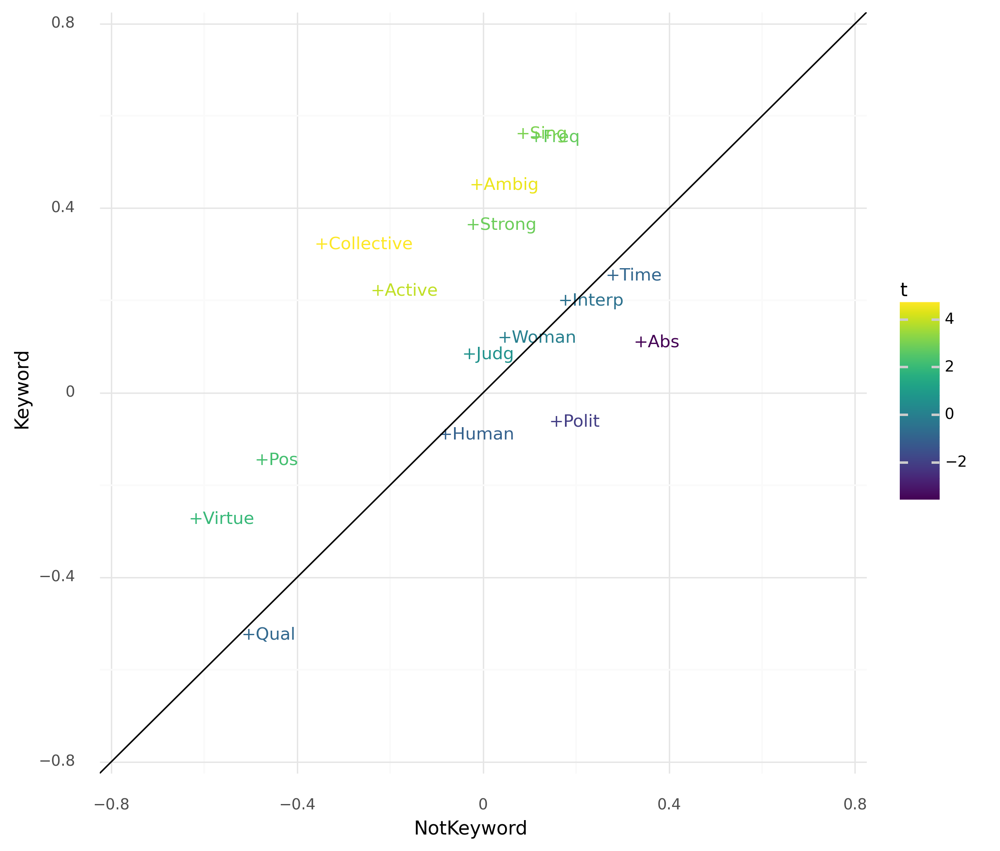

<ggplot: (8730860234545)>

In [61]:
p9.ggplot(
    odf2.reset_index(),
    p9.aes(x='NotKeyword',y='Keyword',label='feat', color='t')
) + p9.theme_minimal() + p9.geom_text(size=10) + p9.xlim(-.75,.75) + p9.ylim(-.75,.75) + p9.geom_abline(intercept=0,slope=1)